In [9]:
!pip install data-gradients
!pip install pdf2image
!apt-get install poppler-utils
!pip install Pygments

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 17.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.3/108.3 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.9/913.9 kB 30.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 459.5/459.5 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.5/226.5 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 107.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.0 MB/s eta 0

In [10]:
import yaml

yaml_file_path = '/content/data/data.yaml'

with open(yaml_file_path, 'r') as f:
  data_yaml = yaml.safe_load(f)

In [11]:
data_yaml

{'train': '/content/data/train/images',
 'val': '/content/data/test/images',
 'nc': 3,
 'names': ['without_mask', 'with_mask', 'mask_weared_incorrect']}

In [12]:
dataset_parms = {
    'data_dir' : '/content/data',
    'train_images_dir' : 'train/images',
    'train_labels_dir' : 'train/labels',
    'val_images_dir' : 'test/images',
    'val_labels_dir' : 'test/labels',
    'classes' : ['without_mask', 'with_mask', 'mask_weared_incorrect']
}

In [13]:
from data_gradients.datasets.detection import YoloFormatDetectionDataset

train_set = YoloFormatDetectionDataset(root_dir = '/content/data',
                                       images_dir = 'train/images',
                                       labels_dir = 'train/labels')

val_set = YoloFormatDetectionDataset(root_dir = '/content/data',
                                       images_dir = 'test/images',
                                       labels_dir = 'test/labels')

In [14]:
from data_gradients.managers.detection_manager import DetectionAnalysisManager
import matplotlib

matplotlib.use('Agg')

analyzer = DetectionAnalysisManager(report_title = 'Face Mask Detection',
                                    train_data = train_set,
                                    val_data = val_set,
                                    class_names = ['without_mask', 'with_mask', 'mask_weared_incorrect'])

analyzer.run()

  - Executing analysis with: 
  - batches_early_stop: None 
  - len(train_data): 597 
  - len(val_data): 256 
  - log directory: /content/logs/Face_Mask_Detection 
  - Archive directory: /content/logs/Face_Mask_Detection/archive_20250514-100110 
  - feature extractor list: {'Image Features': [SummaryStats, ImagesResolution, ImageColorDistribution, ImagesAverageBrightness], 'Object Detection Features': [DetectionClassHeatmap, DetectionBoundingBoxArea, DetectionBoundingBoxPerImageCount, DetectionBoundingBoxSize, DetectionClassFrequency, DetectionClassesPerImageCount, DetectionBoundingBoxIoU, DetectionResizeImpact]}
╔══════════════════════════════════════════════════════════════════════════╗
║  To better understand how to tackle the data issues highlighted in this  ║
║  report, explore our comprehensive course on analyzing computer vision   ║
║  datasets. click here: https://hubs.ly/Q01XpHBT0                         ║
╚══════════════════════════════════════════════════════════════════════

Analyzing... :   0%|          | 0/597 [00:00<?, ?it/s]


--------------------------------------------------------------------------------
In which format are your images loaded ?
--------------------------------------------------------------------------------

Options:
[0] | RGB
[1] | BGR
[2] | LAB
[3] | Other

Your selection (Enter the corresponding number) >>> 0
Great! You chose: `RGB`

--------------------------------------------------------------------------------
Which comes first in your annotations, the class id or the bounding box?
--------------------------------------------------------------------------------
Here's a sample of how your labels look like:
Each line corresponds to a bounding box.
tensor([[1.0000, 0.4775, 0.4690, 0.1100, 0.1947]], dtype=torch.float64)
Options:
[0] | Label comes first (e.g. [class_id, x1, y1, x2, y2])
[1] | Bounding box comes first (e.g. [x1, y1, x2, y2, class_id])

Your selection (Enter the corresponding number) >>> 0
Great! You chose: `Label comes first (e.g. [class_id, x1, y1, x2, y2])`

----------

Analyzing... :   0%|          | 1/597 [00:32<5:25:22, 32.76s/it]

Great! You chose: `cxcywh: x-center, y-center, width, height		(YOLO format)`


Summarizing... :  50%|█████     | 1/2 [00:00<00:00,  1.18it/s]/usr/local/lib/python3.11/dist-packages/data_gradients/visualize/seaborn_renderer.py:287: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.4`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  ax = seaborn.violinplot(**plot_args)
/usr/local/lib/python3.11/dist-packages/data_gradients/visualize/seaborn_renderer.py:287: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.4`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  ax = seaborn.violinplot(**plot_args)
Summarizing... : 100%|██████████| 2/2 [00:05<00:00,  2.74s/it]


Dataset successfully analyzed!
Starting to write the report, this may take around 10 seconds...

Your dataset evaluation has been completed!

----------------------------------------------------------------------------------------------------
Training Configuration...
`DetectionDataConfig` cache is not enabled because `cache_path=None` was not set.

----------------------------------------------------------------------------------------------------
Report Location:
    - Temporary Folder (will be overwritten next run):
        └─ /content/logs/Face_Mask_Detection
                ├─ Report.pdf
                └─ summary.json
    - Archive Folder:
        └─ /content/logs/Face_Mask_Detection/archive_20250514-100110
                ├─ Report.pdf
                └─ summary.json

Seen a glitch? Have a suggestion? Visit https://github.com/Deci-AI/data-gradients !


In [15]:
from pdf2image import convert_from_path
pages = convert_from_path('/content/logs/Face_Mask_Detection/Report.pdf', 500)

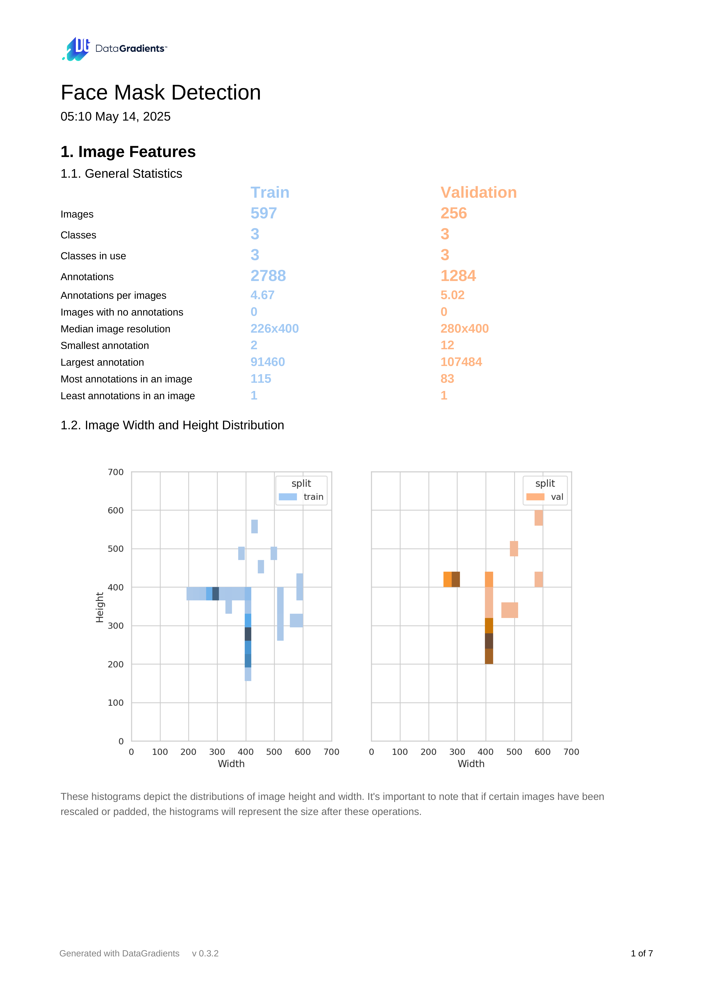

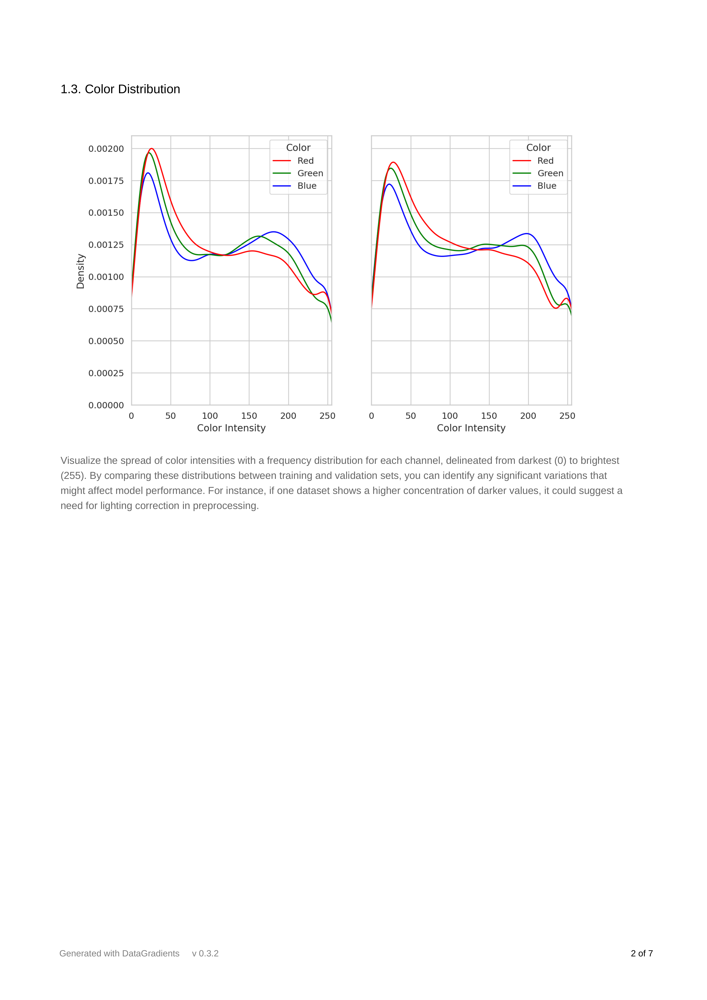

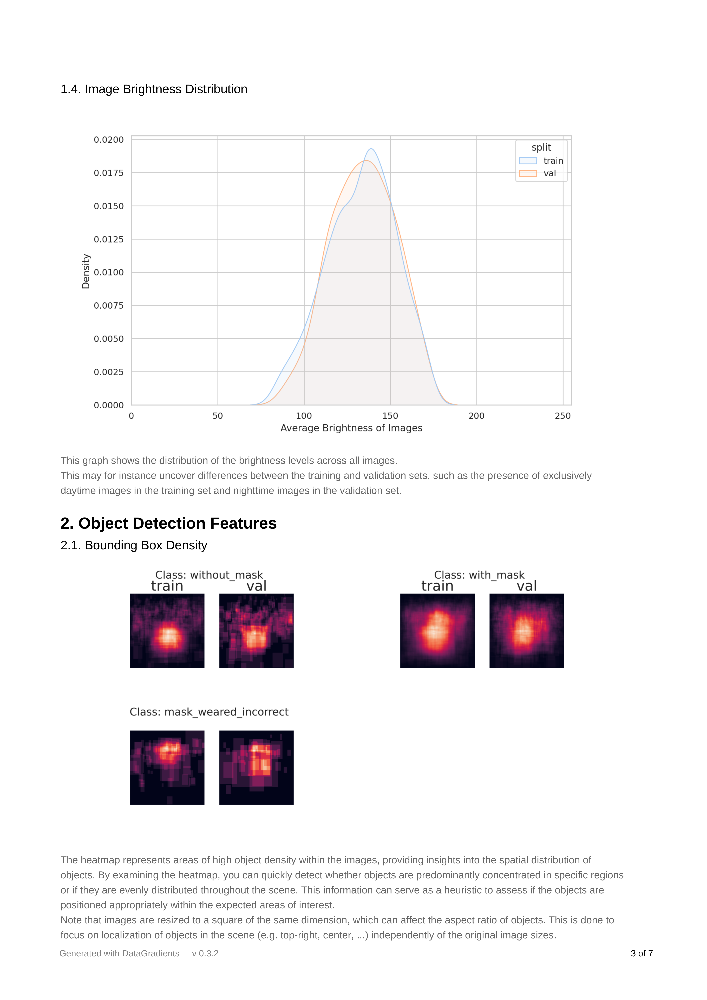

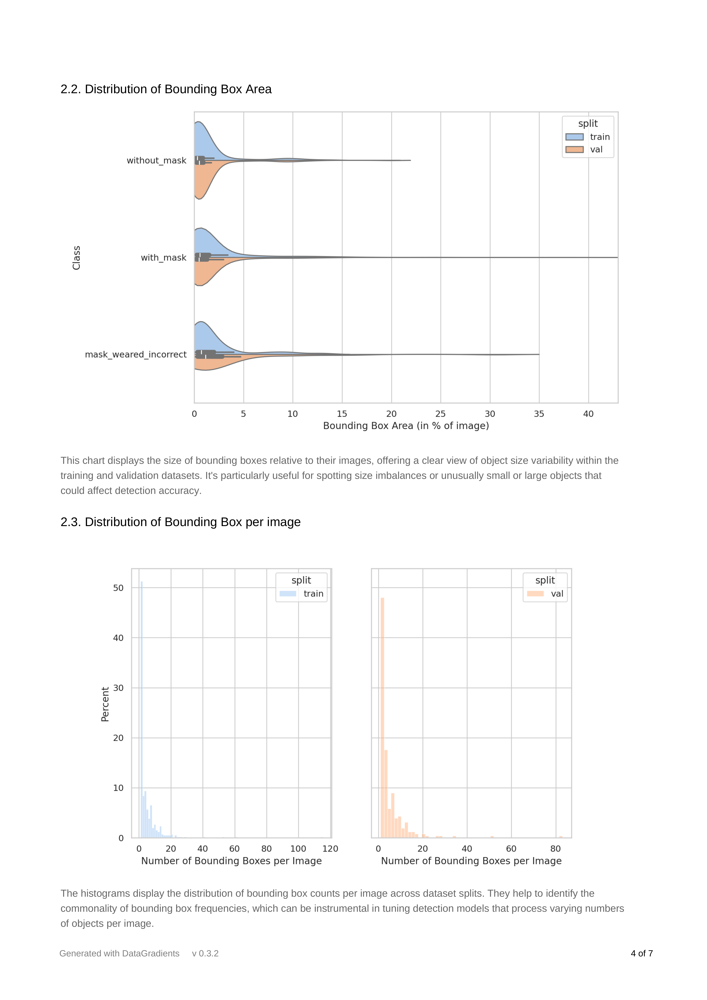

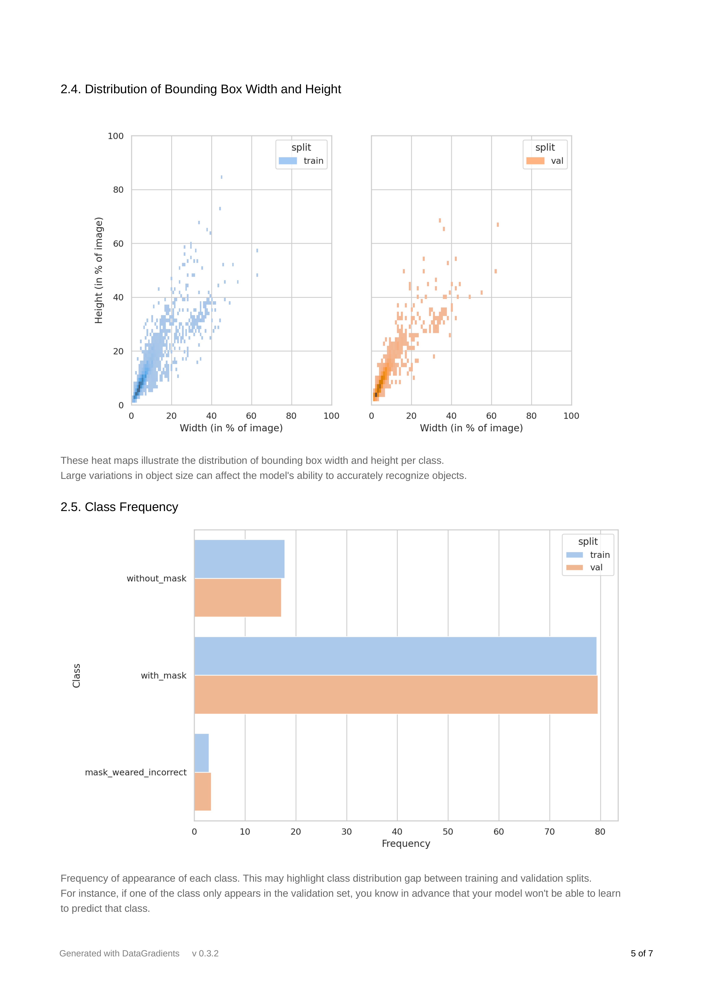

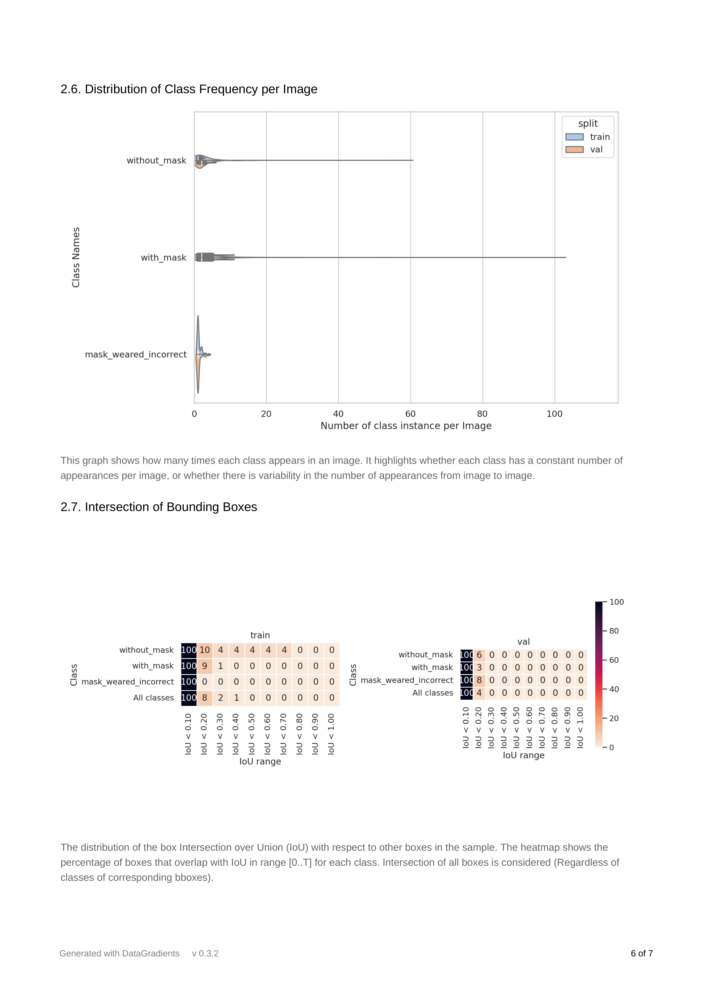

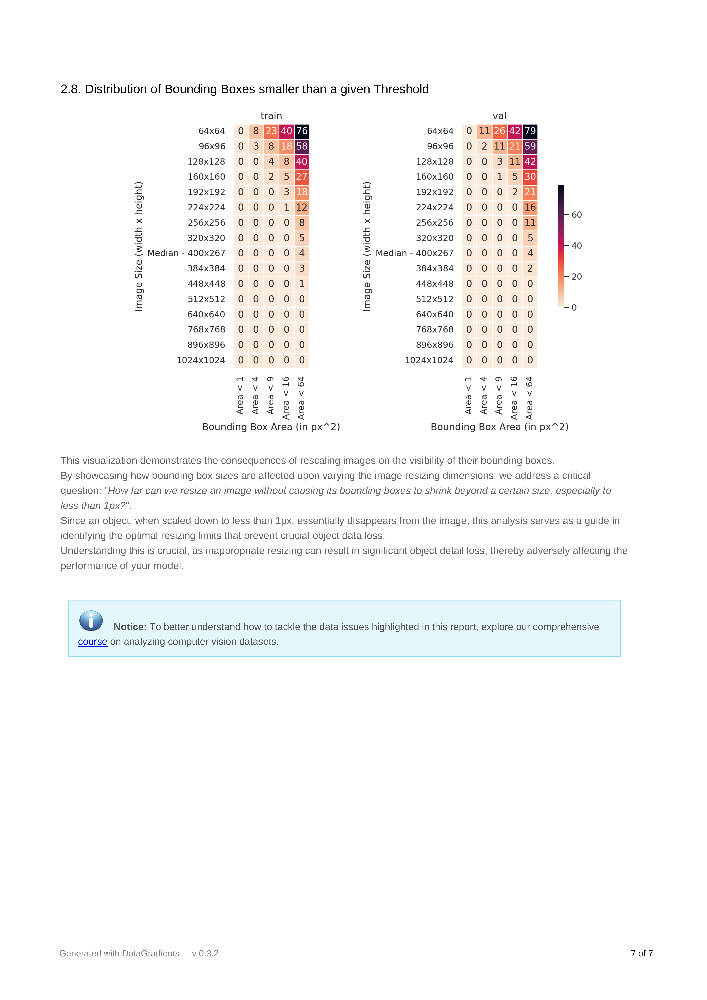

In [32]:
from IPython.display import display

for items in pages:
  display(items)